In [2]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from scipy.stats import binned_statistic_2d
from scipy.signal import hilbert
import cmocean
from matplotlib.colors import Normalize
import gsw
import matplotlib.animation as animation
import requests
from datetime import datetime, timedelta
import matplotlib.dates as mdates

import pandas as pd
from scipy.signal import butter, filtfilt
from io import StringIO
from scipy.ndimage import gaussian_filter
import glob
import os

In [3]:
# season seperated

/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out,

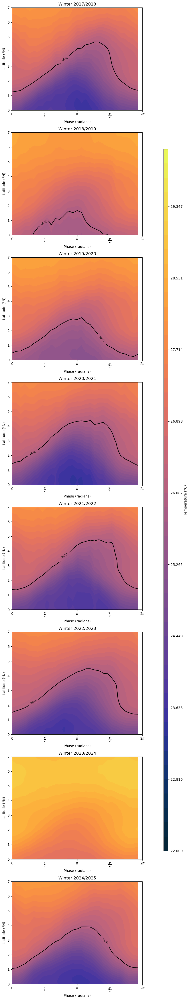

In [85]:
lon_range = np.arange(-160, -110, 1)  # Constrain by glorys data
n_bins = 30
phase_bins = np.linspace(0, 2 * np.pi, n_bins + 1)
isotherm_level = 26  # 26°C isotherm

# Latitude and plot params for temp
plot_params = {
    "temp": {"cmap": cmocean.cm.thermal, "levels": np.linspace(22, 30, 50)},
}

# Helper function to plot temperature with 26°C isotherm
def plot_temp_composite(composite_ds, latitude, year_label, ax):
    """Creates a single Hovmöller plot for temperature with 26°C isotherm."""
    temp_params = plot_params["temp"]
    
    # Filled contour for temperature
    c = ax.contourf(
        phase_bins[:-1], latitude, composite_ds["temp"].T, 
        levels=temp_params["levels"], cmap=temp_params["cmap"]
    )
    
    # Overlay 26°C isotherm
    isotherm = ax.contour(
        phase_bins[:-1], latitude, composite_ds["temp"].T,
        levels=[isotherm_level], colors="black", linewidths=1.5, linestyles="solid"
    )
    ax.clabel(isotherm, inline=True, fontsize=8, fmt=f"{isotherm_level}°C")
    
    # Axes labels and formatting
    ax.set_title(f"{year_label}", fontsize=12)
    ax.set_xticks(np.linspace(0, 2 * np.pi, num=5))
    ax.set_xticklabels(['0', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'2$\pi$'])
    ax.set_ylim(0, 7)
    ax.set_ylabel("Latitude (°N)")
    ax.set_xlabel("Phase (radians)")

    return c  # return colorbar object
    
# Define the time periods you want to plot
seasons = [
    ("2017-08-01", "2018-02-28", "Winter 2017/2018"),
    ("2018-08-01", "2019-02-28", "Winter 2018/2019"),
    ("2019-08-01", "2020-02-28", "Winter 2019/2020"),
    ("2020-08-01", "2021-02-28", "Winter 2020/2021"),
    ("2021-08-01", "2022-02-28", "Winter 2021/2022"),
    ("2022-08-01", "2023-02-28", "Winter 2022/2023"),
    ("2023-08-01", "2024-02-28", "Winter 2023/2024"),
    ("2024-08-01", "2025-02-28", "Winter 2024/2025"),

]



fig, axes = plt.subplots(len(seasons), 1, figsize=(6, len(seasons)*5))

for ax, (year1, year2, year_label) in zip(axes, seasons):
    # Load data
    composite_ds = xr.open_dataset(f'/Volumes/external/TIW/netCDF/composite-{year1}-to-{year2}.nc')
    composite_ds = composite_ds.sel(longitude=slice(-160, -110)).mean(dim='longitude')
    latitude = composite_ds['latitude']

    # Plot temperature + 26°C isotherm
    c = plot_temp_composite(composite_ds, latitude, year_label, ax)

# Add a common colorbar
#cbar = fig.colorbar(c, ax=axes.ravel().tolist(), orientation='vertical', shrink=0.8)

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.1, 0.15, 0.03, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(c, cax=cbar_ax)


cbar.set_label("Temperature (°C)")

plt.tight_layout()
plt.show()


In [5]:
len(seasons)

5

In [ ]:
# composite of all seasons

KeyError: "No variable named 'temp'. Variables on the dataset include ['so', 'thetao', 'uo', 'vo', 'depth', 'latitude', 'time']"

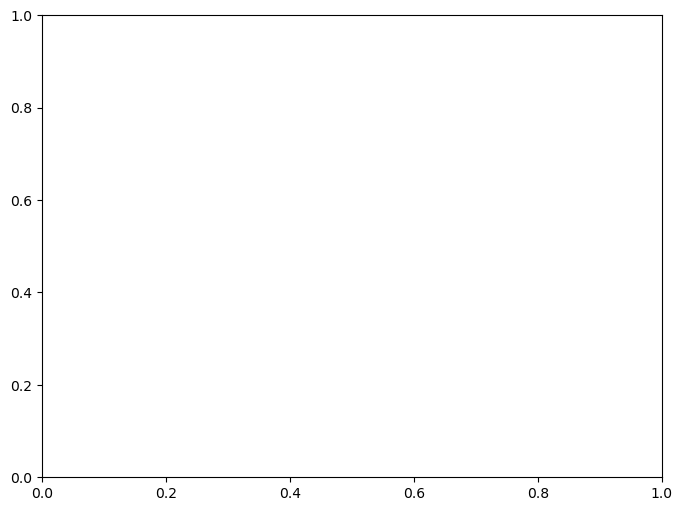

In [155]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean

# Parameters
lon_range = np.arange(-160, -110, 1)  # Constrain by glorys data
n_bins = 30
phase_bins = np.linspace(0, 2 * np.pi, n_bins + 1)
isotherm_level = 26  # 26°C isotherm

plot_params = {
    "temp": {"cmap": cmocean.cm.thermal, "levels": np.linspace(24, 30, 50)},
}

# Define all winter seasons you want to average
seasons = [
    ("2018-08-01", "2019-02-28"),
    ("2019-08-01", "2020-02-28"),
    ("2020-08-01", "2021-02-28"),
    ("2021-08-01", "2022-02-28"),
    #("2022-08-01", "2023-02-28"),
    #("2023-08-01", "2024-02-28"),
    #("2024-08-01", "2025-02-28")
]



# Load and average composite data across all seasons
composite_list = []
#cmems_mod_glo_phy_my_0.083deg_P1D-m_so-thetao-uo-vo_170.00W-110.00W_0.00N-10.00N_0.49m_{year1}-08-01_to_{year2}-02-28.nc
for year1, year2 in seasons:
    composite_ds = xr.open_dataset(f'/Volumes/external/TIW/netCDF/composite-{year1}-to-{year2}.nc')
    composite_ds = composite_ds.sel(longitude=slice(-160, -110)).mean(dim='longitude')
    composite_list.append(composite_ds)

# Combine all seasons into a single dataset and average
combined_composite = xr.concat(composite_list, dim="season").mean(dim="season")
latitude = combined_composite['latitude']

# Plot the combined composite for temperature
fig, ax = plt.subplots(figsize=(8, 6))

c = ax.contourf(
    phase_bins[:-1], latitude, combined_composite["temp"].T,
    levels=plot_params["temp"]["levels"], cmap=plot_params["temp"]["cmap"]
)

# Overlay 26°C isotherm
isotherm = ax.contour(
    phase_bins[:-1], latitude, combined_composite["temp"].T,
    levels=[isotherm_level], colors="black", linewidths=1.5, linestyles="solid"
)
ax.clabel(isotherm, inline=True, fontsize=8, fmt=f"{isotherm_level}°C")

# Axes formatting
ax.set_title("Composite Hovmöller: All Winters Combined", fontsize=14)
ax.set_xticks(np.linspace(0, 2 * np.pi, num=5))
ax.set_xticklabels(['0', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'2$\pi$'])
ax.set_ylim(0, 7)
ax.set_ylabel("Latitude (°N)")
ax.set_xlabel("Phase (radians)")

# Add colorbar
cbar = fig.colorbar(c, ax=ax, orientation='vertical', shrink=0.8)
cbar.set_label("Temperature (°C)")

plt.tight_layout()
plt.show()


In [103]:
plot_params = {
    "temp": {"cmap": cmocean.cm.thermal, "levels": np.linspace(24, 30, 50)},
    "temp_gradient": {"cmap": cmocean.cm.dense, "levels": np.linspace(0, 0.2, 50)},
    "sal": {"cmap": cmocean.cm.haline, "levels": np.linspace(33, 35.2, 50)},
    "sal_anomaly": {"cmap": cmocean.cm.balance, "levels": np.linspace(-0.3, 0.3, 50)},
    "relative_vorticity_normalized": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5e6, 0.5e6, 50)},
    "shear_rate_normalized": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5e6, 0.5e6, 50)},
    "convergence": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5, 0.5, 50)},
    "T_b_hor": {"cmap": cmocean.cm.balance, "levels": np.linspace(-1e-19, 1e-19, 50)},
    "T_v_hor": {"cmap": cmocean.cm.balance, "levels": np.linspace(-2e-15, 2e-15, 50)},
    "uo": {"cmap": cmocean.cm.delta, "levels": np.linspace(-1.5, 1.5, 50)},
    "vo": {"cmap": cmocean.cm.delta, "levels": np.linspace(-1, 1, 50)}
}

plot_params = {
    "temp_gradient": {"cmap": cmocean.cm.dense, "levels": np.linspace(0, 0.2, 50)},
}



/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out,

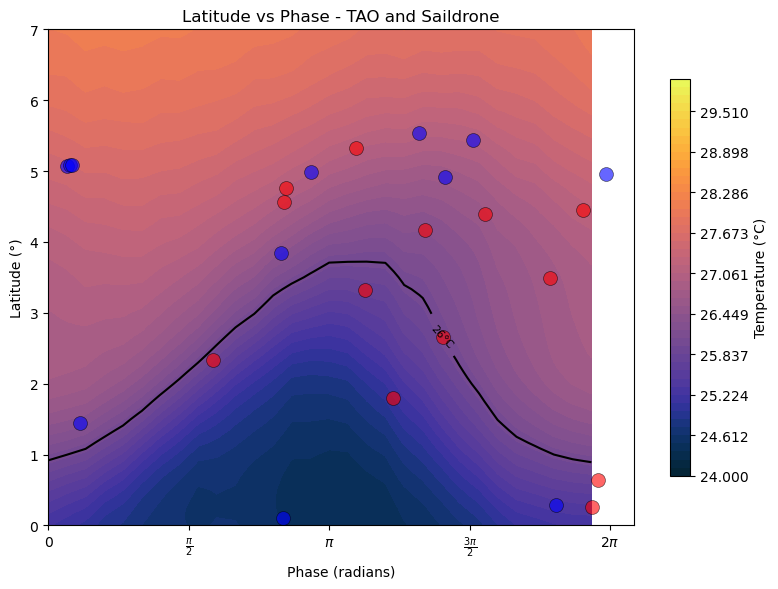

In [104]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean

# Parameters
lon_range = np.arange(-160, -110, 1)  # Constrain by glorys data
n_bins = 30
phase_bins = np.linspace(0, 2 * np.pi, n_bins + 1)
isotherm_level = 26  # 26°C isotherm

plot_params = {
    "temp": {"cmap": cmocean.cm.thermal, "levels": np.linspace(24, 30, 50)},
}

# Define all winter seasons to average
seasons = [
    ("2017-08-01", "2018-02-28"),
    ("2018-08-01", "2019-02-28"),
    ("2019-08-01", "2020-02-28"),
    ("2020-08-01", "2021-02-28"),
    ("2021-08-01", "2022-02-28")
]

# Load and average composite data across all seasons
composite_list = []
for year1, year2 in seasons:
    composite_ds = xr.open_dataset(f'/Volumes/external/TIW/netCDF/composite-{year1}-to-{year2}.nc')
    composite_ds = composite_ds.sel(longitude=slice(-160, -110)).mean(dim='longitude')
    composite_list.append(composite_ds)

# Combine all seasons into a single dataset and average
combined_composite = xr.concat(composite_list, dim="season").mean(dim="season")
latitude = combined_composite['latitude']

# Plot the combined composite for temperature
fig, ax = plt.subplots(figsize=(8, 6))

c = ax.contourf(
    phase_bins[:-1], latitude, combined_composite["temp"].T,
    levels=plot_params["temp"]["levels"], cmap=plot_params["temp"]["cmap"]
)

# Overlay 26°C isotherm
isotherm = ax.contour(
    phase_bins[:-1], latitude, combined_composite["temp"].T,
    levels=[isotherm_level], colors="black", linewidths=1.5, linestyles="solid"
)
ax.clabel(isotherm, inline=True, fontsize=8, fmt=f"{isotherm_level}°C")

# Axes formatting
ax.set_title("Composite Hovmöller: All Winters Combined", fontsize=14)
ax.set_xticks(np.linspace(0, 2 * np.pi, num=5))
ax.set_xticklabels(['0', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'2$\pi$'])
ax.set_ylim(0, 7)
ax.set_ylabel("Latitude (°N)")
ax.set_xlabel("Phase (radians)")

# Add colorbar
cbar = fig.colorbar(c, ax=ax, orientation='vertical', shrink=0.8)
cbar.set_label("Temperature (°C)")

plt.tight_layout()

# Load TAO mooring data
df_tao = pd.read_csv('/Volumes/external/TIW/csv/TAO-fronts-with-phase.csv')
df_tao = df_tao.dropna(subset=['phase'])
df_tao = df_tao[df_tao['lat'] < 5]

# Filter strong and weak fronts from TAO mooring data
strong_tao = df_tao[df_tao['temp_diff'] >= 1]
weak_tao = df_tao[(df_tao['temp_diff'] < 1) & (df_tao['temp_diff'] > 0.5)]

# Plot TAO mooring fronts
#plt.scatter(strong_tao['phase'], strong_tao['lat'], c='hotpink', s=100, alpha=0.6, edgecolors='k', linewidth=0.5)
#plt.scatter(weak_tao['phase'], weak_tao['lat'], c='green', s=100, alpha=0.6, edgecolors='k', linewidth=0.5)

# Load Saildrone data
df_sd = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv')
df_sd = df_sd.dropna(subset=['phase'])
df_sd = df_sd[df_sd['manual_QC'] == 0]
#df_sd = df_sd[df_sd['lat'] < 7]

# Filter strong and weak fronts from Saildrone data
strong_sd = df_sd[df_sd['temp_diff'] >= 1]
weak_sd = df_sd[(df_sd['temp_diff'] < 1) & (df_sd['temp_diff'] > 0.5)]

# Plot Saildrone fronts
plt.scatter(strong_sd['phase'], strong_sd['lat'], c='red', s=100, alpha=0.6, edgecolors='k', linewidth=0.5)
plt.scatter(weak_sd['phase'], weak_sd['lat'], c='blue', s=100, alpha=0.6, edgecolors='k', linewidth=0.5)

# Finalize plot
plt.ylim(0, 7)
plt.xlabel('Phase (radians)')
plt.ylabel('Latitude (°)')
plt.title('Latitude vs Phase - TAO and Saildrone')
plt.tight_layout()

# Save the plot
#plt.savefig('/Volumes/external/TIW/Latitude_vs_Phase.png', dpi=300)
plt.show()


In [105]:
len(df_sd)

36

/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out,

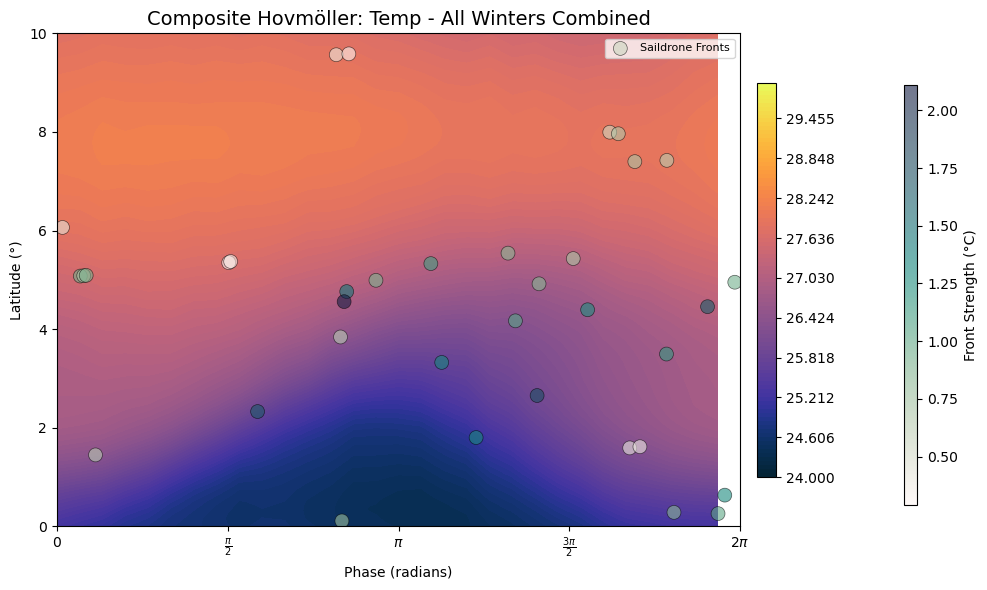

In [149]:
# individual variables to plot
lon_range = np.arange(-160, -110, 1)  # Constrain by glorys data
n_bins = 30
phase_bins = np.linspace(0, 2 * np.pi, n_bins + 1)
isotherm_level = 26  # 26°C isotherm

# Plot parameters - expand with new variables if needed
plot_params = {
    "temp": {"cmap": cmocean.cm.thermal, "levels": np.linspace(24, 30, 100)},
    "temp_gradient": {"cmap": cmocean.cm.dense, "levels": np.linspace(0, 0.1, 50)},
    "sal": {"cmap": cmocean.cm.haline, "levels": np.linspace(33, 35.2, 50)},
    "sal_anomaly": {"cmap": cmocean.cm.balance, "levels": np.linspace(-0.3, 0.3, 50)},
    "relative_vorticity_normalized": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5e6, 0.5e6, 50)},
    "shear_rate_normalized": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5e6, 0.5e6, 50)},
    "convergence": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5, 0.5, 50)},
    "T_b_hor": {"cmap": cmocean.cm.balance, "levels": np.linspace(-1e-19, 1e-19, 50)},
    "T_v_hor": {"cmap": cmocean.cm.balance, "levels": np.linspace(-2e-15, 2e-15, 50)},
    "HCL": {"cmap": cmocean.cm.balance, "levels": np.linspace(-3e-5, 3e-5, 50)},
    "uo": {"cmap": cmocean.cm.delta, "levels": np.linspace(-1.5, 1.5, 50)},
    "vo": {"cmap": cmocean.cm.delta, "levels": np.linspace(-1, 1, 50)}
}

# Variable to plot - change this to switch between temp, temp_gradient, etc.
var_to_plot = "temp"  # Change to "temp" or other variables

# Define all winter seasons to average
seasons = [
    ("2017-08-01", "2018-02-28"),
    ("2018-08-01", "2019-02-28"),
    ("2019-08-01", "2020-02-28"),
    ("2020-08-01", "2021-02-28"),
    ("2021-08-01", "2022-02-28")
]

# Load and average composite data across all seasons
composite_list = []
for year1, year2 in seasons:
    composite_ds = xr.open_dataset(f'/Volumes/external/TIW/netCDF/composite-{year1}-to-{year2}.nc')
    composite_ds = composite_ds.sel(longitude=slice(-160, -110)).mean(dim='longitude')
    composite_list.append(composite_ds)

# Combine all seasons into a single dataset and average
combined_composite = xr.concat(composite_list, dim="season").mean(dim="season")
latitude = combined_composite['latitude']

# === Plotting Function ===
def plot_composite_with_fronts(var_to_plot):
    fig, ax = plt.subplots(figsize=(9, 6))

    # Contour plot
    params = plot_params[var_to_plot]
    c = ax.contourf(
        phase_bins[:-1], latitude, combined_composite[var_to_plot].T,
        levels=params["levels"], cmap=params["cmap"]
    )

    # Move colorbar outside to the right
    cbar = fig.colorbar(c, ax=ax, orientation='vertical', shrink=0.8, pad=0.02)
    #cbar.set_label(params["label"])


    #isotherm = ax.contour(
    #    phase_bins[:-1], latitude, combined_composite["temp"].T,
    #    levels=[26.2], colors="black", linewidths=1.5, linestyles="solid"
    #)
    ax.clabel(isotherm, inline=True, fontsize=8, fmt=f"{isotherm_level}°C")

    # Axes formatting
    ax.set_title(f"Composite Hovmöller: {var_to_plot.replace('_', ' ').title()} - All Winters Combined", fontsize=14)
    ax.set_xticks(np.linspace(0, 2 * np.pi, num=5))
    ax.set_xticklabels(['0', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'2$\pi$'])
    ax.set_ylim(0, 7)
    ax.set_ylabel("Latitude (°N)")
    ax.set_xlabel("Phase (radians)")

    # === Overlay TAO Mooring Fronts ===
    df_tao = pd.read_csv('/Volumes/external/TIW/csv/TAO-fronts-with-phase.csv').dropna(subset=['phase'])
    df_tao = df_tao[df_tao['lat'] < 5]

    strong_tao = df_tao[df_tao['temp_diff'] >= 1]
    weak_tao = df_tao[(df_tao['temp_diff'] < 1) & (df_tao['temp_diff'] > 0.5)]

    #ax.scatter(strong_tao['phase'], strong_tao['lat'], c='hotpink', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Strong TAO Fronts")
    #ax.scatter(weak_tao['phase'], weak_tao['lat'], c='green', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Weak TAO Fronts")

    df_sd = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv').dropna(subset=['phase'])
    df_sd = df_sd[(df_sd['manual_QC'] == 0) & (df_sd['lat'] < 10)]

    strong_sd = df_sd[df_sd['temp_diff'] >= 1]
    weak_sd = df_sd[(df_sd['temp_diff'] < 1) & (df_sd['temp_diff'] > 0.5)]
    sc=ax.scatter(df_sd['phase'], df_sd['lat'], c=df_sd['temp_diff'],cmap=cmocean.cm.tempo, s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Saildrone Fronts")
    ax.legend([], [], frameon=False)
    ax.legend(loc='upper right', fontsize=8)
    cbar_ax = fig.add_axes([1.01, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
    cbar = plt.colorbar(sc, cax=cbar_ax, orientation='vertical')
    cbar.set_label('Front Strength (°C)', fontsize=10)

    # Final formatting
    ax.set_ylim(0, 10)
    ax.set_xlim(0, 2*np.pi)
    ax.set_xlabel('Phase (radians)')
    ax.set_ylabel('Latitude (°)')
    plt.tight_layout()

    plt.show()

# === Run the plot function for selected variable ===
plot_composite_with_fronts(var_to_plot)


/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/katiekohlman/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out,

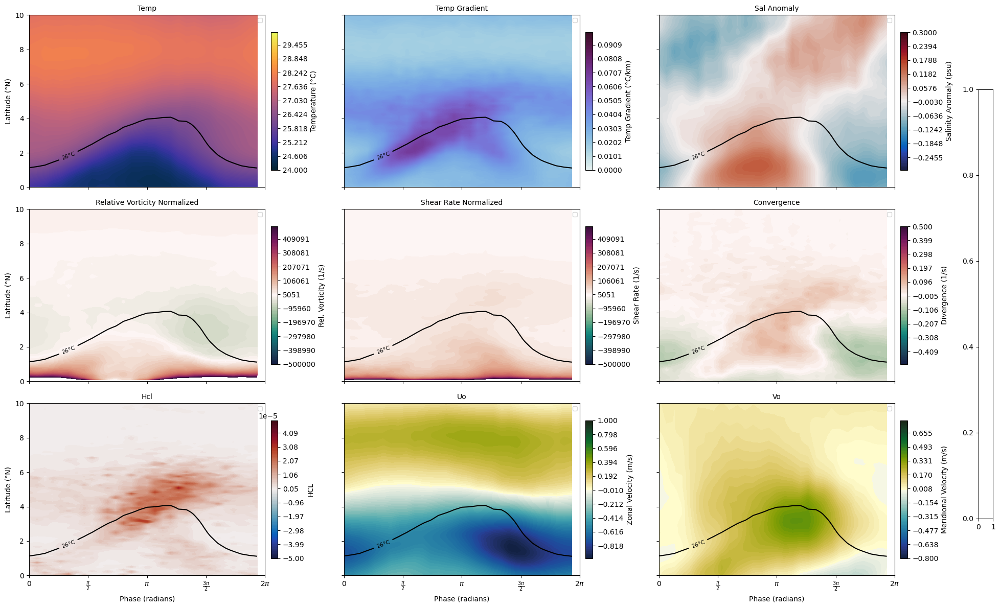

In [148]:
# one big plot
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean
df_sd = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv').dropna(subset=['phase'])
# Parameters
lon_range = np.arange(-160, -110, 1)
n_bins = 30
phase_bins = np.linspace(0, 2 * np.pi, n_bins + 1)
isotherm_level = 26

# Plot parameters - expand with new variables if needed
plot_params = {
    "temp": {"cmap": cmocean.cm.thermal, "levels": np.linspace(24, 30, 100), "label": "Temperature (°C)"},
    "temp_gradient": {"cmap": cmocean.cm.dense, "levels": np.linspace(0, 0.1, 100), "label": "Temp Gradient (°C/km)"},
   # "sal": {"cmap": cmocean.cm.haline, "levels": np.linspace(33, 35.2, 50), "label": "Salinity (psu)"},
    "sal_anomaly": {"cmap": cmocean.cm.balance, "levels": np.linspace(-0.3, 0.3, 100), "label": "Salinity Anomaly (psu)"},
    "relative_vorticity_normalized": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5e6, 0.5e6, 100), "label": "Rel. Vorticity (1/s)"},
    "shear_rate_normalized": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5e6, 0.5e6, 100), "label": "Shear Rate (1/s)"},
    "convergence": {"cmap": cmocean.cm.curl, "levels": np.linspace(-0.5, 0.5, 100), "label": "Divergence (1/s)"},
    "HCL": {"cmap": cmocean.cm.balance, "levels": np.linspace(-5e-5, 5e-5, 100), "label": "HCL"},
    "uo": {"cmap": cmocean.cm.delta, "levels": np.linspace(-1, 1, 100), "label": "Zonal Velocity (m/s)"},
    "vo": {"cmap": cmocean.cm.delta, "levels": np.linspace(-.8, .8, 100), "label": "Meridional Velocity (m/s)"},
}

#combined_composite['divergence'] = combined_composite['convergence']
# Define all winter seasons to average
seasons = [
    ("2017-08-01", "2018-02-28"),
    ("2018-08-01", "2019-02-28"),
    ("2019-08-01", "2020-02-28"),
    ("2020-08-01", "2021-02-28"),
    ("2021-08-01", "2022-02-28")
]

# Load and average composite data across all seasons
composite_list = []
for year1, year2 in seasons:
    composite_ds = xr.open_dataset(f'/Volumes/external/TIW/netCDF/composite-{year1}-to-{year2}.nc')
    composite_ds = composite_ds.sel(longitude=slice(-160, -110)).mean(dim='longitude')
    composite_list.append(composite_ds)

# Combine all seasons into a single dataset and average
combined_composite = xr.concat(composite_list, dim="season").mean(dim="season")
latitude = combined_composite['latitude']

# === Plotting Function for All Subplots ===
def plot_all_composites():
    n_vars = len(plot_params)
    ncols = 3
    nrows = int(np.ceil(n_vars / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(19, 4 * nrows), sharex=True, sharey=True)
    axes = axes.flatten()

    for i, (var, params) in enumerate(plot_params.items()):
        ax = axes[i]

        # Contour plot
        c = ax.contourf(
            phase_bins[:-1], latitude, combined_composite[var].T,
            levels=params["levels"], cmap=params["cmap"]
        )

        isotherm = ax.contour(
            phase_bins[:-1], latitude, combined_composite["temp"].T,
            levels=[26.2], colors="black", linewidths=1.5, linestyles="solid"
        )
        ax.clabel(isotherm, inline=True, fontsize=8, fmt=f"{isotherm_level}°C")

        # Colorbar for each subplot
        cbar = fig.colorbar(c, ax=ax, orientation='vertical', shrink=0.8, pad=0.02)
        cbar.set_label(params.get("label", var))

        ax.set_title(var.replace('_', ' ').title(), fontsize=10)
        ax.set_xticks(np.linspace(0, 2 * np.pi, num=5))
        ax.set_xticklabels(['0', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'2$\pi$'])

            # === Overlay TAO Mooring Fronts ===
        df_tao = pd.read_csv('/Volumes/external/TIW/csv/TAO-fronts-with-phase.csv').dropna(subset=['phase'])
        #df_tao = df_tao[df_tao['lat'] < 5]
    
        #sc=ax.scatter(df_tao['phase'], df_tao['lat'], c=df_tao['temp_diff'],cmap=cmocean.cm.tempo, s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Saildrone Fronts")
        #ax.legend([], [], frameon=False)
        #ax.scatter(strong_tao['phase'], strong_tao['lat'], c='hotpink', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Strong TAO Fronts")
        #ax.scatter(weak_tao['phase'], weak_tao['lat'], c='green', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Weak TAO Fronts")
    
        # === Overlay Saildrone Fronts ===
        df_sd = pd.read_csv('/Volumes/external/TIW/csv/Saildrone-fronts-QC-with-phase.csv').dropna(subset=['phase'])
        df_sd = df_sd[(df_sd['manual_QC'] == 0) & (df_sd['lat'] < 10)]
    
        strong_sd = df_sd[df_sd['temp_diff'] >= 1]
        weak_sd = df_sd[(df_sd['temp_diff'] < 1) & (df_sd['temp_diff'] > 0.5)]
        #sc=ax.scatter(df_sd['phase'], df_sd['lat'], c=df_sd['temp_diff'],cmap=cmocean.cm.tempo, s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Saildrone Fronts")
        ax.legend([], [], frameon=False)
        #ax.scatter(strong_sd['phase'], strong_sd['lat'], c='red', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Strong Saildrone Fronts")
        #ax.scatter(weak_sd['phase'], weak_sd['lat'], c='blue', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Weak Saildrone Fronts")

        # === Overlay Seaglider Fronts ===
        df_sg = pd.read_csv('/Volumes/external/TIW/csv/Seaglider-fronts-with-phase.csv').dropna(subset=['phase'])
        df_sg=df_sg[df_sg['lat']<4]
        #sc=ax.scatter(df_sg['phase'], df_sg['lat'], c='red', s=100, alpha=0.6, edgecolors='k', linewidth=0.5, label="Seaglider Fronts")
        ax.legend([], [], frameon=False)
        
        ax.legend(loc='upper right', fontsize=8)
    

        ax.set_ylim(0, 10)
        if i % ncols == 0:
            ax.set_ylabel("Latitude (°N)")
        if i >= (nrows - 1) * ncols:
            ax.set_xlabel("Phase (radians)")

    for j in range(i+1, len(axes)):  # Hide any unused subplots
        axes[j].axis('off')
        
    cbar_ax = fig.add_axes([1.01, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
    #cbar = plt.colorbar(sc, cax=cbar_ax, orientation='vertical')
    #cbar.set_label('Front Strength (°C)', fontsize=10)
    
    plt.tight_layout()
    plt.show()

# === Run the combined plot function ===
plot_all_composites()


In [111]:
len(df_tao)

160

# Composite for each longitude

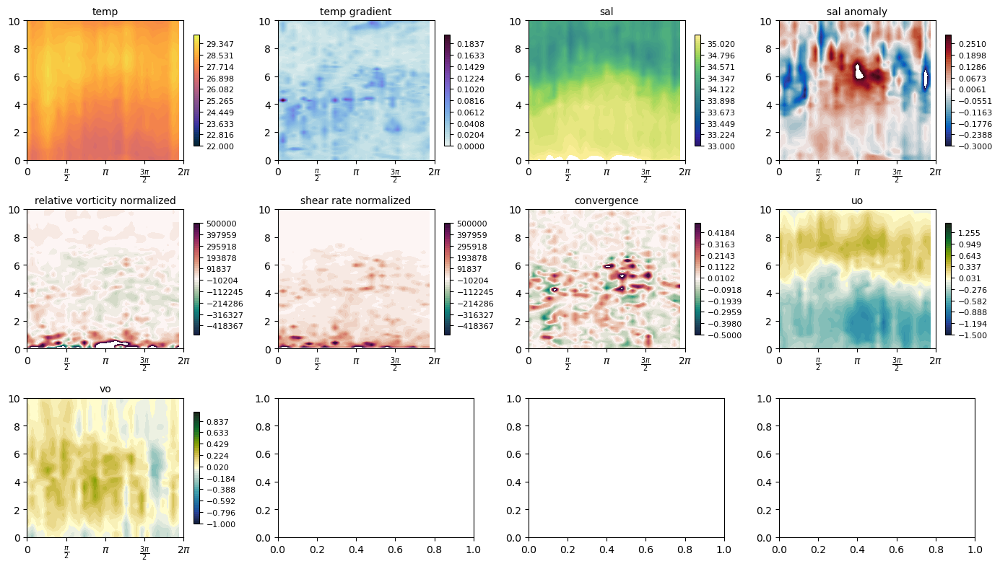

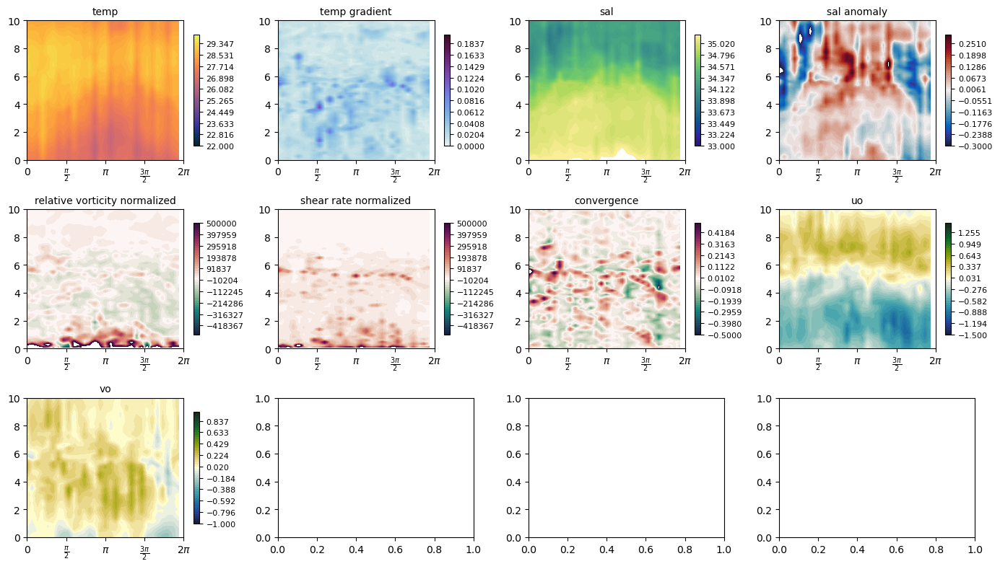

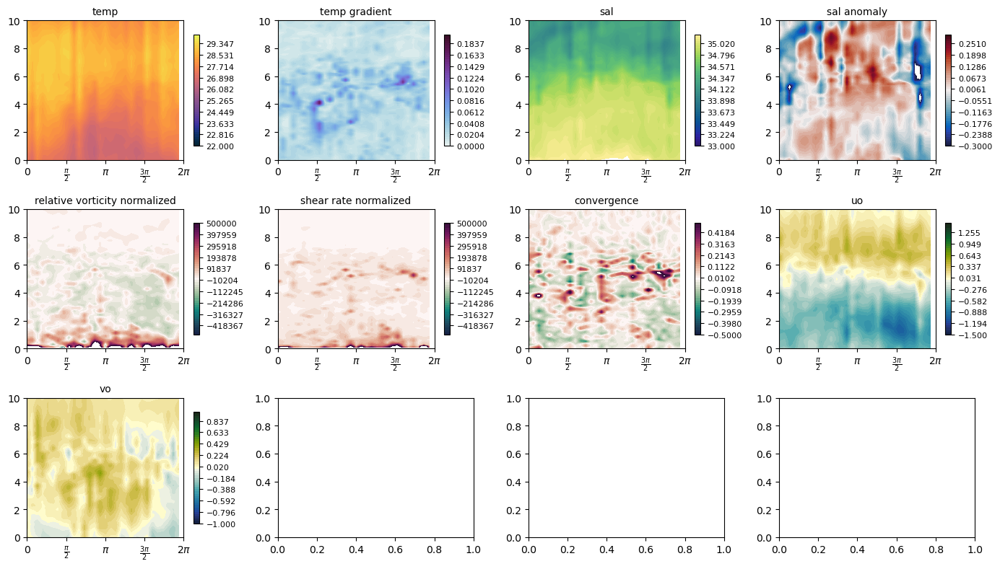

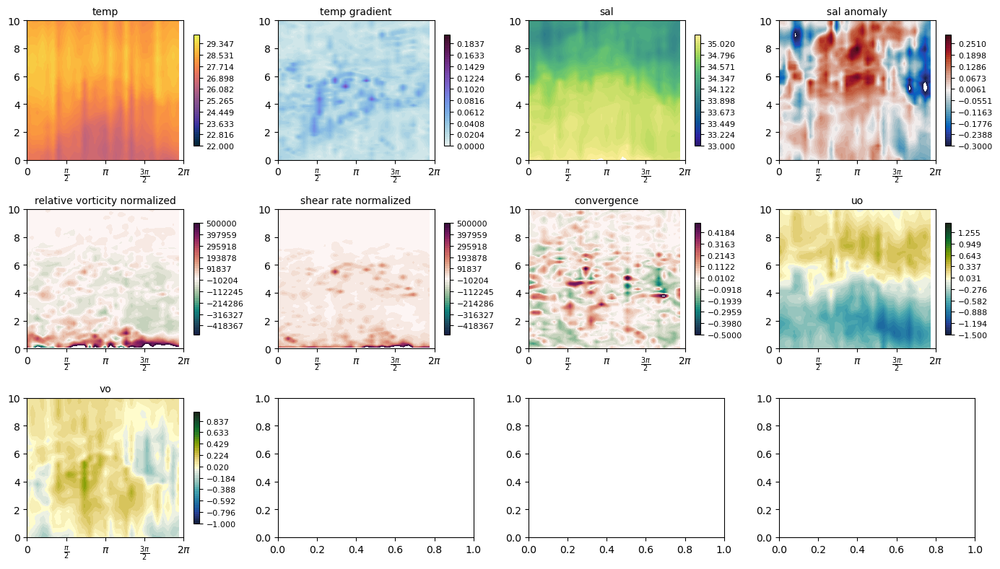

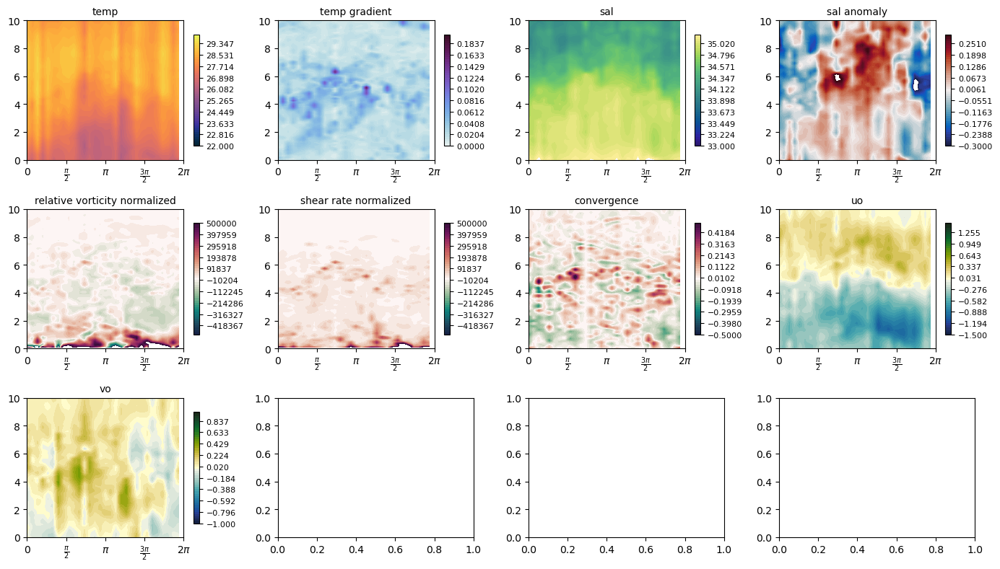

...

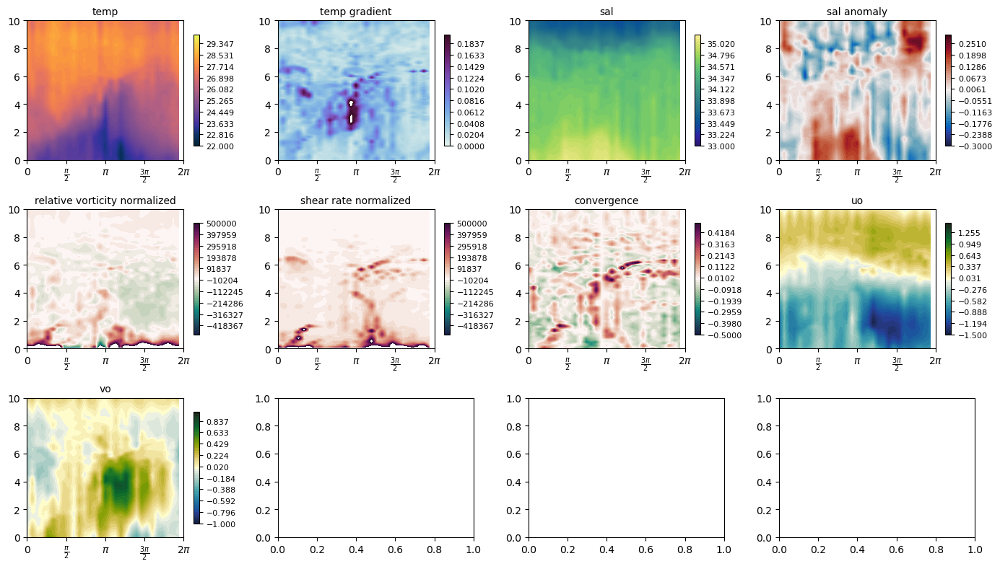

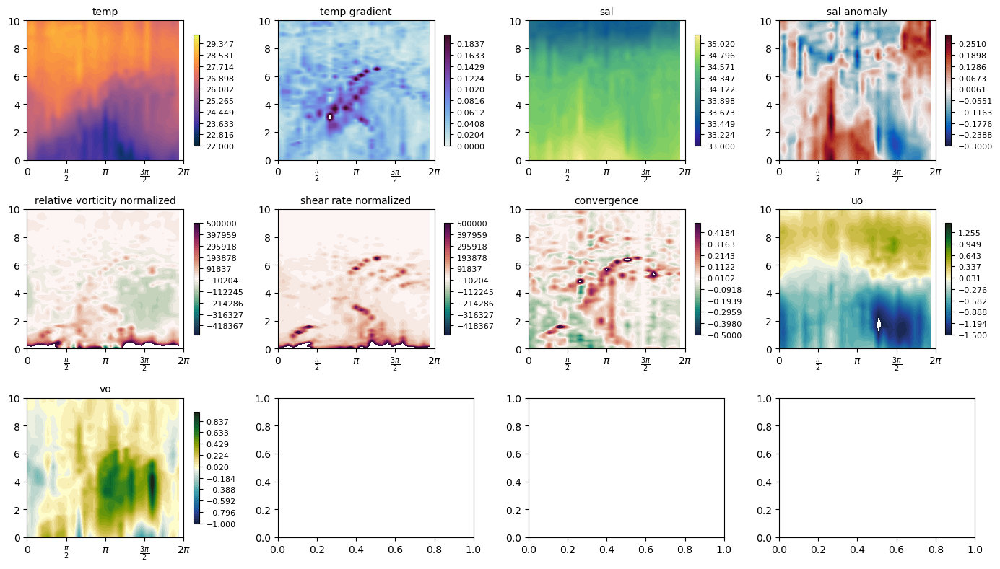

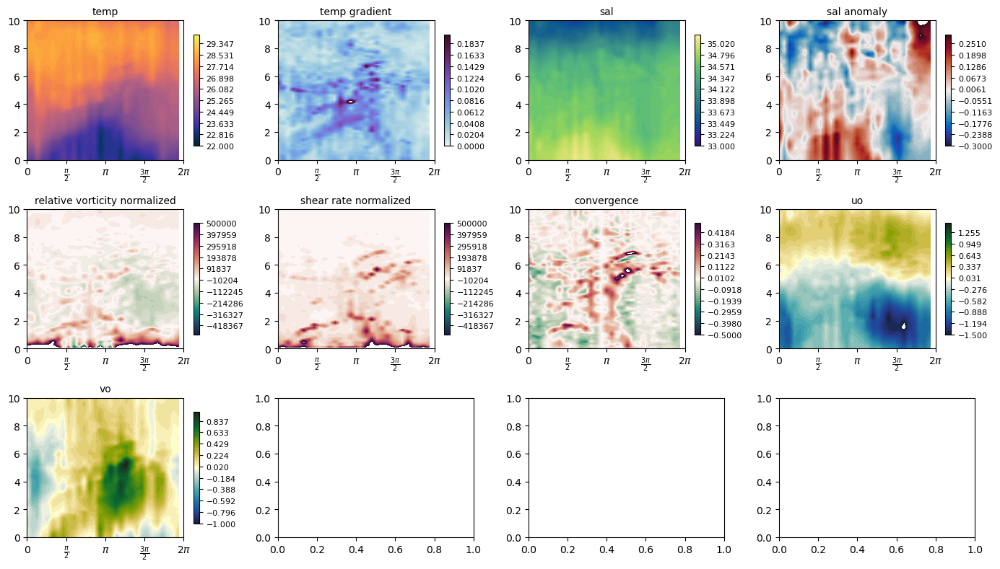

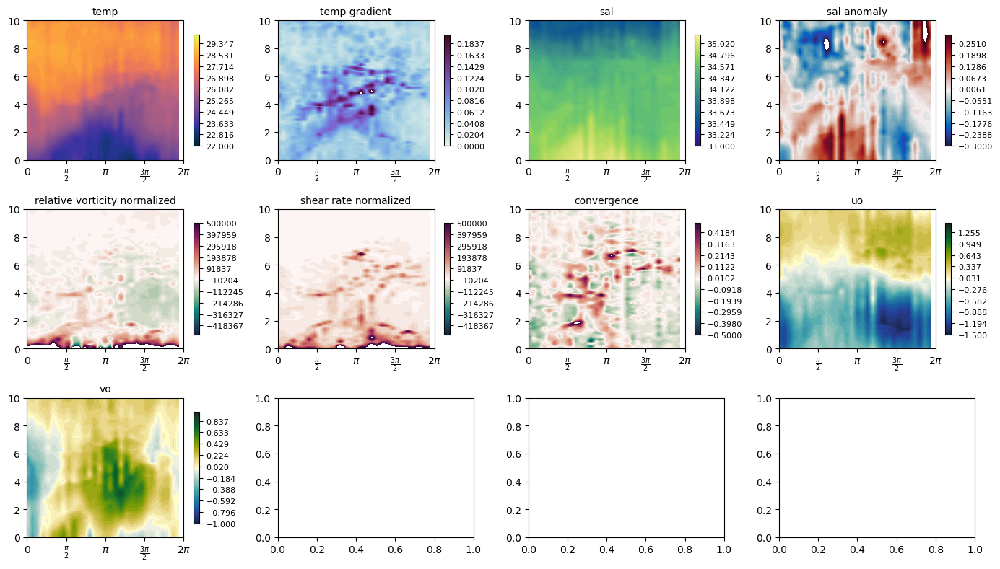

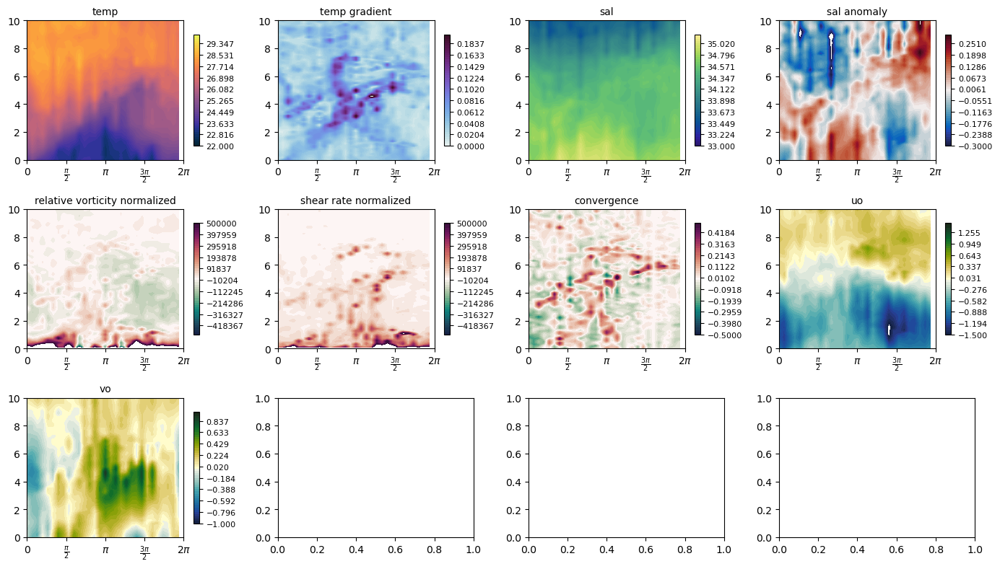


KeyboardInterrupt



In [35]:
# Composite for each longitude
for lon in composite_ds["longitude"].values:
    composite_ds_2D = composite_ds.sel(longitude=lon)  # Reduce to 2D
    
    # Call the plotting function with or without isotherm level
    plot_simple_composite_hovmoller(
        n_bins, 
        composite_ds_2D, 
        latitude, 
        title=f"Hovmöller Diagram at Longitude {lon:.2f}°", 
        plot_params=plot_params, 
        isotherm_level=None  
    )

In [ ]:
    `

#### old

In [ ]:
fronts_df_test = fronts_df[fronts_df['manual_QC']==0]
fronts_df_strong = fronts_df[(fronts_df['temp_diff']>=1)&(fronts_df['manual_QC']==0)]


fig, ax = plt.subplots(4, 1, figsize=(14, 8))

ax[0].hist(fronts_df_test['phase'],50,color='black',label='all fronts')
ax[0].hist(fronts_df_strong['phase'],50,color='red',label='strong fronts (>1C)')
ax[1].set_title('phase of saildrone-detected fronts')
ax[0].set_xticklabels(['0', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'])
ax[0].legend()

ax[1].hist(fronts_df_test['lat'],50,color='black')
ax[1].hist(fronts_df_strong['lat'],50,color='red')
ax[1].set_title('latitude of saildrone-detected fronts')

ax[2].hist(fronts_df_test['lon'],50,color='black')
ax[2].hist(fronts_df_strong['lon'],50,color='red')
ax[2].set_xlim(-178,-110)
ax[2].set_title('longitude of saildrone-detected fronts')

ax[3].hist(fronts_df_test['temp_diff'],50,color='black')
ax[3].hist(fronts_df_strong['temp_diff'],50,color='red')
ax[3].set_title('strength (temp diff) of saildrone-detected fronts')

plt.tight_layout()
plt.show()

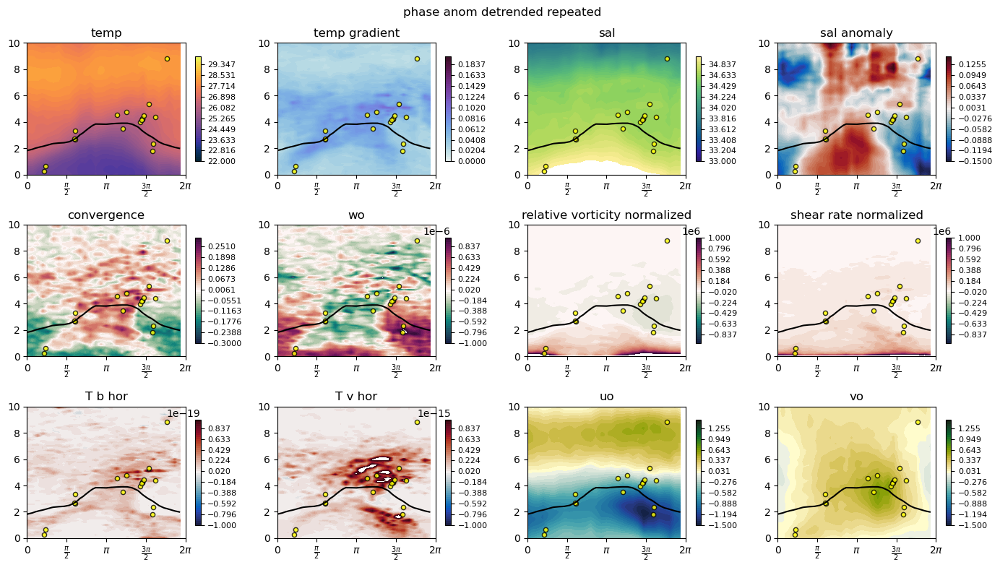

In [122]:
plot_large_hovemoller('phase_anom_detrended_repeated', 30)

In [107]:
len(fronts_df)

18

## code is very messy: 
* need to use other scripts to expand longitudinal extent.
* color fronts by mission
* add in other la nina seasons